<a href="https://colab.research.google.com/github/angiecoronel12/Sleep_Stage/blob/main/4_Arquitectura_de_la_red_neuronal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 4. **Arquitectura de la red - Red Neuronal Recurrent (RNN)**

En este notebook se define la estructura del modelo para clasificación, se realiza el entrenamiento, y las iteraciones en función de mejorar las metricas de desempeño elegidas

In [ ]:
# carga de librerias
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential, Model
from keras.layers import SimpleRNN, LSTM, GRU, Dense, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import log_loss
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns
from sklearn.metrics import classification_report, cohen_kappa_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.callbacks import Callback
import pickle
from keras.initializers import glorot_uniform
from tensorflow.keras.callbacks import TensorBoard
from tensorflow import keras


In [ ]:
# importa los dataframes
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Cargar el diccionario desde el archivo
load_path = '/content/drive/My Drive/Deep_learning_proyecto/Signals_10_subjects/reformatted_data.pkl'

# Cargar el diccionario desde el archivo
with open(load_path, 'rb') as file:
    loaded_data = pickle.load(file)

# Extraer las variables
look_back = loaded_data['look_back']
n_steps_ahead = loaded_data['n_steps_ahead']
X_train = loaded_data['X_train']
y_train = loaded_data['y_train']
X_test = loaded_data['X_test']
y_test = loaded_data['y_test']
scaler = loaded_data['scaler']

In [ ]:
print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_train shape: (13686, 10, 33)
y_train shape: (13686, 1)
X_test shape: (3633, 10, 33)
y_test shape: (3633, 1)


**Mapeo de los datos categoricos y redimensionamiento**

In [ ]:
# Aplana el arreglo bidimensional a unidimensional
y_train_flat = y_train.flatten()
y_test_flat = y_test.flatten()

# Define el mapeo de clases
class_mapping = {'W': 4, '1': 2, '2': 1, '3': 0, 'R': 3}

# Aplica el mapeo a cada etiqueta en y_train_flat
y_train_encoded = np.array([class_mapping[label] for label in y_train_flat])
y_test_encoded = np.array([class_mapping[label] for label in y_test_flat])

y_train_encoded = y_train_encoded.reshape(-1, 1)
y_test_encoded = y_test_encoded.reshape(-1, 1)

print(y_train_encoded.shape)
print(y_test_encoded.shape)

(13686, 1)
(3633, 1)


In [ ]:
# Es necesario codificar la variable de salida (en binario) para las 5 capas de salida
n_classes = 5
y_train_binary = to_categorical(y_train_encoded, num_classes=n_classes)
print(y_train_binary.shape)

y_test_binary = to_categorical(y_test_encoded, num_classes=n_classes)
print(y_test_binary.shape)

(13686, 5)
(3633, 5)


## **Get model: Se define el Modelo de Red Neuronal Recurrente**

In [ ]:
def Recurrent_Model_MO_classification(X_train, layer_type, n_steps_ahead=1, n_classes=5, dropout_rate=0.5):
    # X_train is used for setting input_shape dimensions
    model = Sequential()

    # Inicializador Glorot Uniform
    initializer = glorot_uniform()
    #initializer = keras.initializers.RandomNormal(mean=.5, stddev=0.5, seed=1)

    if layer_type == 'SimpleRNN':
        model.add(SimpleRNN(25, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2]), kernel_initializer=initializer, name='simple_rnn_layer1'))
        model.add(Dropout(dropout_rate, name='dropout_layer1'))
        model.add(SimpleRNN(25, activation='relu', return_sequences=False, kernel_initializer=initializer, name='simple_rnn_layer2'))
        model.add(Dropout(dropout_rate, name='dropout_layer2'))

    elif layer_type == 'LSTM':
        model.add(LSTM(25, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2]), kernel_initializer=initializer, name='lstm_layer1'))
        model.add(Dropout(dropout_rate, name='dropout_layer1'))
        model.add(LSTM(25, return_sequences=False, kernel_initializer=initializer, name='lstm_layer2'))
        model.add(Dropout(dropout_rate, name='dropout_layer2'))

    elif layer_type == 'GRU':
        model.add(GRU(25, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2]), kernel_initializer=initializer, name='gru_layer1'))
        model.add(Dropout(dropout_rate, name='dropout_layer1'))
        model.add(GRU(25, return_sequences=False, kernel_initializer=initializer, name='gru_layer2'))
        model.add(Dropout(dropout_rate, name='dropout_layer2'))

    model.add(Dense(n_classes, activation='softmax', kernel_initializer=initializer, name='output_layer'))  # Cambiar activación para clasificación

    return model

In [ ]:
# Función para ver el comportamiento de los pesos
def LayerWeightsCallback(layer_name):
    class LayerWeightsCallback_class(Callback):

        def __init__(self, layer_name):
            super().__init__()
            self.weight_stats = {
                'mean': [],
                'std': [],
                'max': [],
            }
            self.layer_name = layer_name

        def on_epoch_end(self, epoch, logs=None):
            if self.layer_name not in ['dropout_layer1', 'dropout_layer2']:
                print(self.layer_name)
                w = self.model.get_layer(self.layer_name).get_weights()[0]
                self.weight_stats['mean'].append(np.mean(w))
                self.weight_stats['std'].append(np.std(w))
                self.weight_stats['max'].append(np.max(w))

    return LayerWeightsCallback_class(layer_name)

def TrainValActivationsCallback(layer_name, X):
    class TrainValActivationsCallback_class(Callback):
        def __init__(self, layer_name, X):
            super().__init__()
            self.activations_stats = {
                'mean': [],
                'std': [],
            }
            self.layer_name = layer_name
            self.X = X

        def on_epoch_end(self, epoch, logs=None):
            layer = self.model.get_layer(self.layer_name)
            model = Model([self.model.input], [layer.output])

            # Get activations for the validation data
            val_activations = model.predict(self.X)
            self.activations_stats['mean'].append(np.mean(val_activations))
            self.activations_stats['std'].append(np.std(val_activations))

    return TrainValActivationsCallback_class(layer_name, X)


### **Modelo con 'GRU'**

In [ ]:
# Crear el modelo con red 'GRU'
type_layer = 'GRU'
model_gru = Recurrent_Model_MO_classification(X_train,type_layer,n_steps_ahead=1,n_classes=5,dropout_rate=0.5)
model_gru.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_layer1 (GRU)            (None, 10, 25)            4500      
                                                                 
 dropout_layer1 (Dropout)    (None, 10, 25)            0         
                                                                 
 gru_layer2 (GRU)            (None, 25)                3900      
                                                                 
 dropout_layer2 (Dropout)    (None, 25)                0         
                                                                 
 output_layer (Dense)        (None, 5)                 130       
                                                                 
Total params: 8530 (33.32 KB)
Trainable params: 8530 (33.32 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


## **Entrenamiento de la red**




In [ ]:
# Convertir etiquetas a float32
X_train = X_train.astype(np.float32)

# Compilar el modelo
model_gru.compile(loss='categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])

# Configurar ModelCheckpoint
checkpoint = ModelCheckpoint("model_checkpoint.h5", monitor='loss', verbose=0, save_best_only=True, save_weights_only=False, mode='auto', save_freq='epoch')

# Configurar early stopping
stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='auto', baseline=None, restore_best_weights=False)

# Callback para los pesos
layer_weights_callback = [LayerWeightsCallback(i.name) for i in model_gru.layers]

# Tensor board
log_dir = './logs'
tensorboard_callback = TensorBoard(log_dir=log_dir)
tb_callback = keras.callbacks.TensorBoard(log_dir = './logs/fit/model_GRU_dropout_0.5', histogram_freq=1,  write_graph=True, write_images=True)

# Entrenar el modelo
history = model_gru.fit(X_train, y_train_binary, epochs=30, validation_split=0.2, verbose=1, callbacks=[checkpoint, stop, layer_weights_callback,tb_callback])

# Obtener la pérdida durante el entrenamiento
loss_values = history.history['loss']


Epoch 1/30
  4/343 [..............................] - ETA: 6s - loss: 1.6173 - accuracy: 0.2266   

342/343 [============================>.] - ETA: 0s - loss: 0.9934 - accuracy: 0.6404gru_layer1
gru_layer2
output_layer
343/343 [==============================] - 12s 21ms/step - loss: 0.9933 - accuracy: 0.6405 - val_loss: 0.7712 - val_accuracy: 0.7253
Epoch 2/30
  6/343 [..............................] - ETA: 3s - loss: 0.8442 - accuracy: 0.7188

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


340/343 [============================>.] - ETA: 0s - loss: 0.7582 - accuracy: 0.7409gru_layer1
gru_layer2
output_layer
343/343 [==============================] - 4s 13ms/step - loss: 0.7581 - accuracy: 0.7411 - val_loss: 0.6402 - val_accuracy: 0.7776
Epoch 3/30
340/343 [============================>.] - ETA: 0s - loss: 0.7088 - accuracy: 0.7591gru_layer1
gru_layer2
output_layer
343/343 [==============================] - 5s 15ms/step - loss: 0.7090 - accuracy: 0.7591 - val_loss: 0.6787 - val_accuracy: 0.7754
Epoch 4/30
340/343 [============================>.] - ETA: 0s - loss: 0.6801 - accuracy: 0.7731gru_layer1
gru_layer2
output_layer
343/343 [==============================] - 6s 17ms/step - loss: 0.6792 - accuracy: 0.7731 - val_loss: 0.6422 - val_accuracy: 0.7816
Epoch 5/30
342/343 [============================>.] - ETA: 0s - loss: 0.6603 - accuracy: 0.7829gru_layer1
gru_layer2
output_layer
343/343 [==============================] - 5s 15ms/step - loss: 0.6605 - accuracy: 0.7829 - val

In [ ]:
# Guardar el modelo completo
model_gru.save("model_gru_3.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Guardar el historial de entrenamiento en un archivo
with open('history_model_gru_3.pkl', 'wb') as file:
    pickle.dump(history, file)

### **Grafica de las perdidas**

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

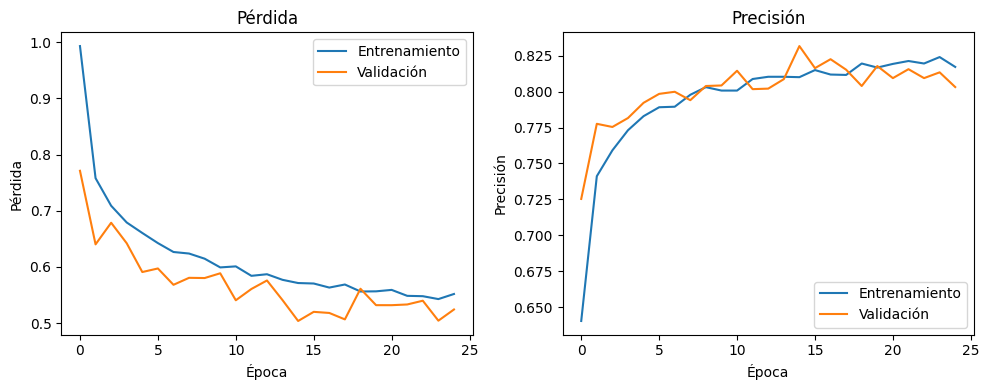

In [ ]:
# Preparar y mostrar gráficas de pérdidas
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Entrenamiento')
plt.plot(val_loss, label='Validación')
plt.title('Pérdida')
plt.xlabel('Época')
plt.ylabel('Pérdida')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(train_acc, label='Entrenamiento')
plt.plot(val_acc, label='Validación')
plt.title('Precisión')
plt.xlabel('Época')
plt.ylabel('Precisión')
plt.legend()
plt.tight_layout()
plt.show()

### **Grafica de los pesos**

In [ ]:
def plot_weight_stats(callbacks,indx='weights'):
  data_type = indx.title()  # Weights or Activations
  mean_stats = {}
  std_stats = {}
  for callback in callbacks:
    layer_name = callback.layer_name
    if layer_name not in ['dropout_layer1', 'dropout_layer2']:
      if indx == 'weights':
        weight_stats = callback.weight_stats
      else:  # indx == 'activations'
        weight_stats = callback.activations_stats
      mean_stats[layer_name] = weight_stats['mean']
      std_stats[layer_name] = weight_stats['std']

  # Create a figure with 2 subplots
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

  # Plot mean data
  for layer_name, mean_values in mean_stats.items():
    epochs = range(len(mean_values))
    ax1.plot(epochs, mean_values, label=f'{layer_name} Mean {data_type}')
  ax1.set_xlabel('Epoch')
  ax1.set_ylabel(f'Mean {data_type} Value')
  ax1.set_title(f'Mean {data_type} Statistics')
  ax1.legend()

  # Plot standard deviation
  for layer_name, std_values in std_stats.items():
    epochs = range(len(std_values))
    ax2.plot(epochs, std_values, label=f'{layer_name} Std {data_type}')
  ax2.set_xlabel('Epoch')
  ax2.set_ylabel(f'Std {data_type} Value')
  ax2.set_title(f'Std Dev {data_type} Statistics')
  ax2.legend()
  plt.tight_layout()
  plt.show()

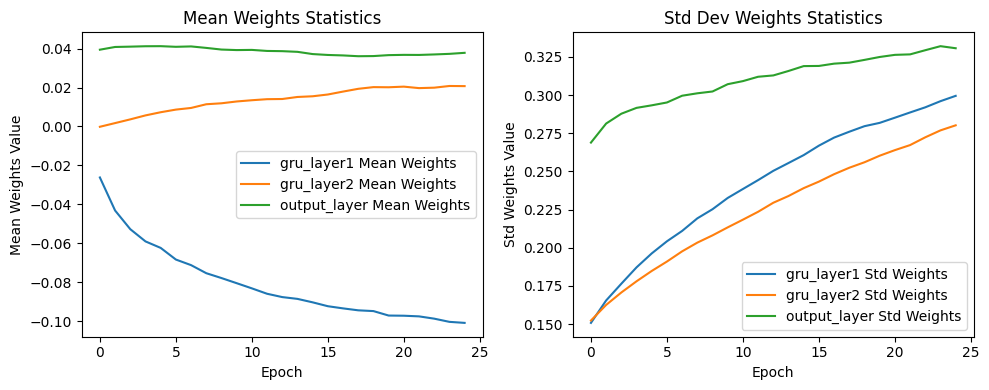

In [ ]:
plot_weight_stats(layer_weights_callback,'weights')

##**Validación (Metricas de desempeño para clasificación)**

In [ ]:
X_test = X_test.astype(np.float32)
# Predicciones
y_est = history.model.predict(X_test)
#y_est = history2.model.predict(X_test)

# Probabilidades de ocurrencia
np.sum(y_est[0])

114/114 [==============================] - 0s 3ms/step


1.0000001

In [ ]:
# Etiqueta con la clase segun la probabilidad de cada muestra
max_indices = np.argmax(y_est, axis=1)

# Convertir los índices a etiquetas binarias
num_classes = y_est.shape[1]
y_est_discreta = np.eye(num_classes)[max_indices]

print("Índices de la mayor probabilidad:", max_indices)
print("Etiquetas binarias:", y_est_discreta)

Índices de la mayor probabilidad: [4 4 4 ... 4 4 4]
Etiquetas binarias: [[0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 ...
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]]


In [ ]:
# Calcular la entropía cruzada
cross_entropy_loss = log_loss(y_test_binary.flatten(), y_est_discreta.flatten())
print("Cross-Entropy Loss:", cross_entropy_loss)

# Calcular la precision del modelo
precision = precision_score(y_test_binary.flatten(), y_est_discreta.flatten())
recall = recall_score(y_test_binary.flatten(), y_est_discreta.flatten())
f1 = f1_score(y_test_binary.flatten(), y_est_discreta.flatten())

print("Precisión del modelo:", precision)
print("Valor de recall:", recall)
print("f1 score:", f1)

Cross-Entropy Loss: 3.670837256805215
Precisión del modelo: 0.7453894852738784
Valor de recall: 0.7453894852738784
f1 score: 0.7453894852738784


In [ ]:
y_test_labels = np.argmax(y_test_binary, axis=1)
y_est_labels = np.argmax(y_est_discreta, axis=1)

class_mapping_reverse = {4: 'W', 2: '1', 1: '2', 0: '3', 3: 'R'}

# Mapear las etiquetas de vuelta a las clases originales
y_test_mapped = [class_mapping_reverse[label] for label in y_test_labels]
y_est_mapped = [class_mapping_reverse[label] for label in y_est_labels]

print("Etiquetas verdaderas (mapeadas):", y_test_mapped[:10])  # Muestra las primeras 10 para verificar
print("Etiquetas predichas (mapeadas): ", y_est_mapped[:10])  # Muestra las primeras 10 para verificar

Etiquetas verdaderas (mapeadas): ['W', 'W', 'W', 'W', 'W', 'W', 'W', 'W', 'W', 'W']
Etiquetas predichas (mapeadas):  ['W', 'W', 'W', 'W', 'W', 'W', 'W', 'W', 'W', 'W']


Precisión (accuracy): 0.7453894852738784
Kapa de cohen: 0.6197816824272332


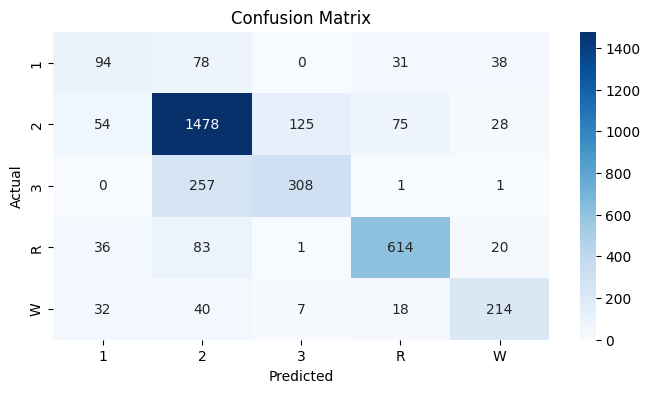

In [ ]:
# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_test_mapped, y_est_mapped)

# Calcular la precisión
accuracy = accuracy_score(y_test_mapped, y_est_mapped)
print("Precisión (accuracy):", accuracy)

# Calcular el kappa de cohen
kappa = cohen_kappa_score(y_test_mapped, y_est_mapped)
print("Kapa de cohen:", kappa)

# Extraer las clases automáticamente de las variables y_test_mapped y y_est_mapped
class_labels = np.unique(np.concatenate((y_test_mapped, y_est_mapped)))

# Crear el plot de la matriz de confusión
plt.figure(figsize=(8, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

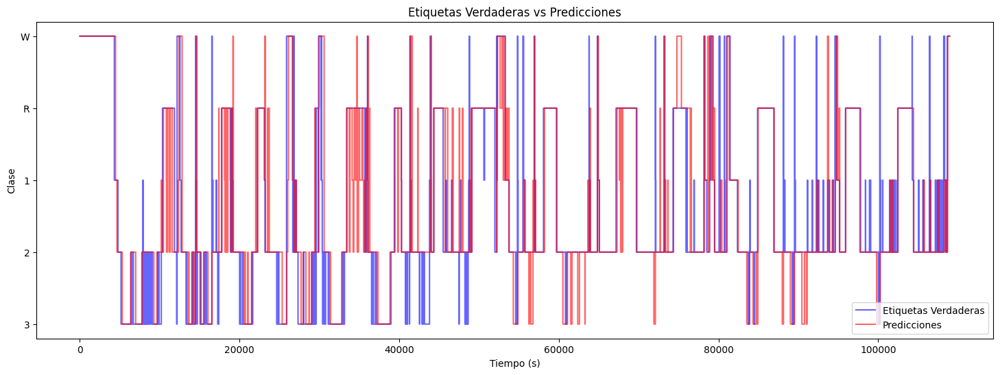

In [ ]:
# Preparar los datos para el gráfico del Hipnograma
tiempos = np.arange(len(y_test_mapped)) * 30  # Crear array de tiempos con duración de 30s por dato
class_order = ["3", "2", "1", "R", "W"]
plt.figure(figsize=(18, 6))
plt.plot(tiempos, y_test_labels, color='blue', label='Etiquetas Verdaderas', drawstyle='steps-pre', alpha=0.6)
plt.plot(tiempos, y_est_labels, color='red', label='Predicciones', drawstyle='steps-pre', alpha=0.6)
plt.xlabel('Tiempo (s)')
plt.ylabel('Clase')
plt.title('Etiquetas Verdaderas vs Predicciones')
plt.yticks(ticks=range(len(class_order)), labels=class_order)
plt.legend()
plt.show()

In [ ]:
# Calcular otras métricas para cada clase
class_labels = np.unique(np.concatenate((y_test_labels, y_est_labels)))

# Inicializar diccionarios para almacenar las métricas por clase
metrics_per_class = {
    'recall': {},
    'f1-score': {},
    'accuracy_per_class': {}
}

# Calcular métricas para cada clase
for i, label in enumerate(class_labels):
    # Filtrar las predicciones y los verdaderos valores para la clase actual
    class_preds = y_est_labels[y_test_labels == label]
    class_true = y_test_labels[y_test_labels == label]

    report = classification_report(class_true, class_preds, labels=[label], zero_division=0, output_dict=True)

    # Almacenar las métricas en el diccionario
    metrics_per_class['recall'][label] = report[str(label)]['recall']
    metrics_per_class['f1-score'][label] = report[str(label)]['f1-score']

    # Calcular accuracy para la clase actual
    accuracy_per_class = accuracy_score(class_true, class_preds)
    metrics_per_class['accuracy_per_class'][label] = accuracy_per_class

# Imprimir las métricas por clase
for label, metrics in metrics_per_class.items():
    print(f"\n{label.capitalize()} per class:")
    for class_label, value in metrics.items():
        print(f"Class {class_label}: {value}")



Recall per class:
Class 0: 0.5432098765432098
Class 1: 0.8397727272727272
Class 2: 0.3900414937759336
Class 3: 0.8143236074270557
Class 4: 0.6881028938906752

F1-score per class:
Class 0: 0.704
Class 1: 0.9129092032118591
Class 2: 0.5611940298507463
Class 3: 0.8976608187134503
Class 4: 0.8152380952380952

Accuracy_per_class per class:
Class 0: 0.5432098765432098
Class 1: 0.8397727272727272
Class 2: 0.3900414937759336
Class 3: 0.8143236074270557
Class 4: 0.6881028938906752


In [ ]:
class_labels = np.unique(y_test_labels)

# Inicializar diccionario para almacenar la entropía cruzada por clase
cross_entropy_per_class = {}
total_cross_entropy = 0

# Calcular entropía cruzada para cada clase
for label in class_labels:
    # Filtrar las probabilidades y las etiquetas para la clase actual
    class_true = (y_test_labels == label).astype(int)
    class_probs = y_est[:, label]

    # Manejo de casos donde todas las verdaderas etiquetas son 0 o 1 para evitar log_loss indefinido
    if np.sum(class_true) == 0 or np.sum(class_true) == len(class_true):
        class_cross_entropy = np.nan
    else:
        # Calcular log_loss
        class_cross_entropy = log_loss(class_true, class_probs)

    # Almacenar el valor en el diccionario
    cross_entropy_per_class[label] = class_cross_entropy

print("\nCross Entropy Loss per class:")
for class_label, value in cross_entropy_per_class.items():
    print(f"Class {class_label}: {value}")
    total_cross_entropy += value  # Suma los valores

print(f"\nTotal Cross Entropy Loss: {total_cross_entropy}")


Cross Entropy Loss per class:
Class 0: 0.3031807840891173
Class 1: 0.4720453099627046
Class 2: 0.17333479883423306
Class 3: 0.19012196011581095
Class 4: 0.1321791422802693

Total Cross Entropy Loss: 1.2708619952821352


## **Tensor board**

In [ ]:
# Cargar la extensión de TensorBoard
%load_ext tensorboard
%tensorboard --logdir ./logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 6607), started 1:35:09 ago. (Use '!kill 6607' to kill it.)

<IPython.core.display.Javascript object>

In [111]:
local_log_dir = './logs'
drive_log_dir = '/content/drive/My Drive/Deep_learning_proyecto/tensorboard_logs'

# Crea el directorio en Google Drive si no existe
!mkdir -p "$drive_log_dir"

# Copia los datos de logs del directorio local a Google Drive
!cp -r "$local_log_dir"/* "$drive_log_dir"

## **Grafica de las activaciones**

In [ ]:
X_test = X_test.astype(np.float32)

cbs_train = [TrainValActivationsCallback(i.name, X_train) for i in history.model.layers]
cbs_test  = [TrainValActivationsCallback(i.name, X_test) for i in history.model.layers]

history2 = history.model.fit(X_train, y_train_binary, epochs=20, validation_data = (X_test,y_test_binary), verbose=0, callbacks=[checkpoint, stop, cbs_train + cbs_test])

114/114 [==============================] - 1s 3ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


114/114 [==============================] - 2s 4ms/step
Epoch 11: early stopping


**Activaciones**

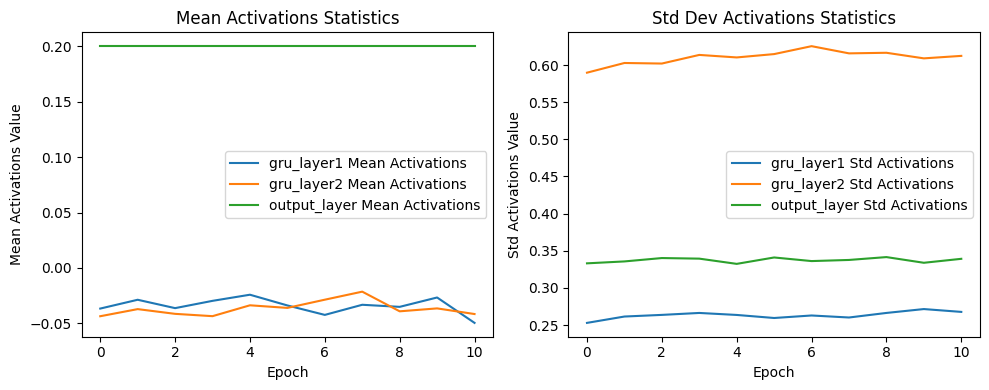

In [ ]:
plot_weight_stats(cbs_train,'activations')

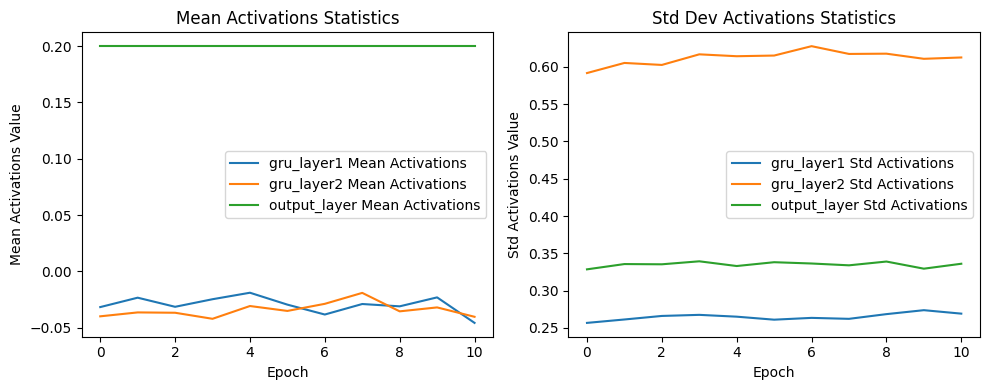

In [ ]:
plot_weight_stats(cbs_test,'activations')